In [349]:
# tmp
import sys
sys.path.append("../giotto-learn/giotto")
import mapper as mp
from mapper.visualize import *

import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN,hierarchical
import networkx as nx
import plotly.graph_objects as go
from tqdm import tqdm

# "Chain shape"

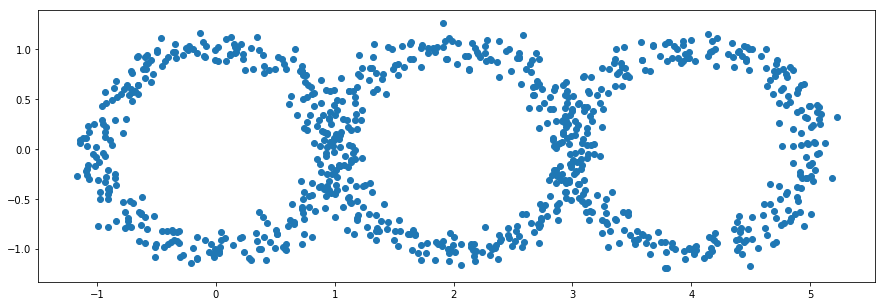

In [86]:
np.random.seed(21)
# let's generate a toy dataset
X = np.array([[np.cos(t)+2*i + np.random.normal(scale = 0.1), np.sin(t)+ np.random.normal(scale = 0.1)] \
              for i in range(3) for t in np.linspace(0,2*np.pi,300)])

plt.figure(figsize = (15,5))
plt.scatter(X[:,0],X[:,1])
plt.show()

In [87]:
pipeline = mp.mapper.make_mapper_pipeline(filter_func=mp.filter.Projection(column_indices=0),
                                          cover=mp.cover.OneDimensionalCover(),
                                          verbose=True,
                                         )
                                          #scaler=MinMaxScaler(),
                                          #clusterer=DBSCAN(),)


graph = pipeline.fit_transform(X)

[Pipeline] ............ (step 1 of 3) Processing scaler, total=   0.0s
[Pipeline] ....... (step 2 of 3) Processing filter_func, total=   0.0s
[Pipeline] ............. (step 3 of 3) Processing cover, total=   0.0s
[Pipeline] .... (step 1 of 3) Processing pullback_cover, total=   0.0s
[Pipeline] ........ (step 2 of 3) Processing clustering, total=   0.0s
[Pipeline] ............. (step 3 of 3) Processing nerve, total=   0.0s


In [88]:
# plot
node_elements = nx.get_node_attributes(graph, 'elements')

pos = nx.spring_layout(graph, seed=0, dim=2)
node_text = [k for k in node_elements.keys()]
node_sizes = [len(el) for el in node_elements.values()]
node_colors = X[:,1]

fig = mp.visualize.create_network_2d(graph, 
                        pos, 
                        node_sizes, 
                        node_colors, 
                        node_text, 
                        node_scale=20)

In [89]:
fig.show()

# "Chain ring shape"

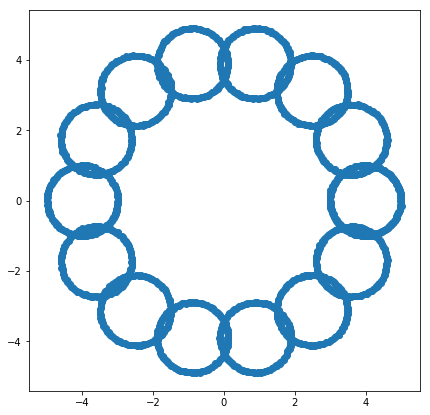

In [269]:
np.random.seed(81)
# let's generate a toy dataset
X = np.array([[np.cos(t)+4*np.cos(i) + np.random.normal(scale = 0.01), \
               np.sin(t) + 4*np.sin(i) + np.random.normal(scale = 0.01)] \
              for i in np.linspace(0,2*np.pi,15) for t in np.linspace(0,2*np.pi,200)])

plt.figure(figsize = (7,7))
plt.scatter(X[:,0],X[:,1])
plt.show()

In [270]:
pipeline = mp.mapper.make_mapper_pipeline(filter_func= None,
                                          cover=mp.cover.CubicalCover(n_intervals = 15, overlap_frac = 0.4),
                                          verbose=True,
                                         )

graph = pipeline.fit_transform(X)

[Pipeline] ............ (step 1 of 3) Processing scaler, total=   0.0s
[Pipeline] ....... (step 2 of 3) Processing filter_func, total=   0.0s
[Pipeline] ............. (step 3 of 3) Processing cover, total=   0.0s
[Pipeline] .... (step 1 of 3) Processing pullback_cover, total=   0.0s
[Pipeline] ........ (step 2 of 3) Processing clustering, total=   0.2s
[Pipeline] ............. (step 3 of 3) Processing nerve, total=   0.3s


In [271]:
# plot
node_elements = nx.get_node_attributes(graph, 'elements')

#pos = dict()
#for n in node_elements.keys(): pos[n] = X[node_elements[n]].mean(axis = 0)
#pos = nx.spring_layout(graph, seed=0, dim=2)
pos = nx.kamada_kawai_layout(graph)
#pos = nx.layout.spectral_layout(graph)

node_text = [k for k in node_elements.keys()]
node_sizes = [len(el) for el in node_elements.values()]
node_colors = X[:,1]

fig = mp.visualize.create_network_2d(graph, 
                        pos, 
                        node_sizes, 
                        node_colors, 
                        node_text, 
                        node_scale=20)
fig.show()

# Star

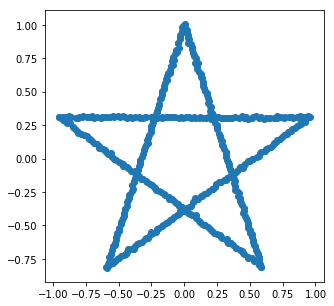

In [272]:
np.random.seed(30)
# generate data
X = []
vertex = [ (np.cos(t),np.sin(t))  for t in np.linspace(0,2*np.pi, 6)[:-1] + np.pi/10]
for p in [[0,2],[0,3],[1,3],[1,4],[2,4]]:
    x0,y0 = vertex[p[0]]
    x1,y1 = vertex[p[1]]
    m = (y1-y0)/(x1-x0)
    c = y1-m*x1
    X += [[x + np.random.normal(scale = 0.005),m*x+c + np.random.normal(scale = 0.005)] for x in np.linspace(x0,x1,100)]

X = np.array(X)

plt.figure(figsize = (5,5))
plt.scatter(X[:,0],X[:,1])
plt.show()

In [273]:
pipeline = mp.mapper.make_mapper_pipeline(filter_func= None,
                                          cover=mp.cover.CubicalCover(n_intervals = 10, overlap_frac = 0.15),
                                          verbose=True,
                                         )

graph = pipeline.fit_transform(X)

[Pipeline] ............ (step 1 of 3) Processing scaler, total=   0.0s
[Pipeline] ....... (step 2 of 3) Processing filter_func, total=   0.0s
[Pipeline] ............. (step 3 of 3) Processing cover, total=   0.0s
[Pipeline] .... (step 1 of 3) Processing pullback_cover, total=   0.0s
[Pipeline] ........ (step 2 of 3) Processing clustering, total=   0.1s
[Pipeline] ............. (step 3 of 3) Processing nerve, total=   0.0s


In [274]:
# plot
node_elements = nx.get_node_attributes(graph, 'elements')

#pos = dict()
#for n in node_elements.keys(): pos[n] = X[node_elements[n]].mean(axis = 0)
#pos = nx.spring_layout(graph, seed=0, dim=2)
pos = nx.kamada_kawai_layout(graph)
#pos = nx.layout.spectral_layout(graph)


node_text = [k for k in node_elements.keys()]
node_sizes = [len(el) for el in node_elements.values()]
node_colors = X[:,1]

fig = mp.visualize.create_network_2d(graph, 
                        pos, 
                        node_sizes, 
                        node_colors, 
                        node_text, 
                        node_scale=20)
fig.show()

In [275]:
# plot
node_elements = nx.get_node_attributes(graph, 'elements')

pos = dict()
for n in node_elements.keys(): pos[n] = X[node_elements[n]].mean(axis = 0)
#pos = nx.spring_layout(graph, seed=0, dim=2)
#pos = nx.kamada_kawai_layout(graph)
#pos = nx.layout.spectral_layout(graph)


node_text = [k for k in node_elements.keys()]
node_sizes = [len(el) for el in node_elements.values()]
node_colors = X[:,1]

fig = mp.visualize.create_network_2d(graph, 
                        pos, 
                        node_sizes, 
                        node_colors, 
                        node_text, 
                        node_scale=20)
fig.show()

# "Santa shape"

Let's try a more complex figure :)

In [231]:
# generate a point cloud
X = []
theta = lambda x :0 if x<0 else 1
for t in np.linspace(0,100*np.pi,5000):
    x = ((37/2*np.sin(t + 39/19) + 8/13*np.sin(2*t + 13/8) + 3/5*np.sin(3*t + 37/11) + 4/9*np.sin(4*t + 19/10) +2/9*np.sin(5*t + 1/11) + 2900/7)*theta(99*np.pi - t)*theta(t - 95*np.pi) + (-10/7*np.sin(9/11 - 2*t) - 296/11*np.sin(9/14 - t) + 29/11*np.sin(3*t + 11/6) + 9/10*np.sin(4*t + 3/10) + 34/33*np.sin(5*t + 13/4) + 4797/14)*theta(95*np.pi - t)*theta(t - 91*np.pi) + (-2*np.sin(17/13 - 3*t) + 307/8*np.sin(t + 9/10) + 13/6*np.sin(2*t + 46/45) + 12/7*np.sin(4*t + 1/4) + 5/4*np.sin(5*t + 16/5) + 5903/13)*theta(91*np.pi - t)*theta(t - 87*np.pi) + (-2/9*np.sin(6/11 - 4*t) + 89/6*np.sin(t + 21/22) + 1/3*np.sin(2*t + 11/8) + 3/7*np.sin(3*t + 4/7) + 1/5*np.sin(5*t + 7/11) + 11312/25)*theta(87*np.pi - t)*theta(t - 83*np.pi) + (378/29*np.sin(t + 17/13) + 14/15*np.sin(2*t + 10/7) + 7/13*np.sin(3*t + 8/9) + 5/8*np.sin(4*t + 6/7) + 3/11*np.sin(5*t + 103/26) + 4297/12)*theta(83*np.pi - t)*theta(t - 79*np.pi) + (862/13*np.sin(t + 17/13) + 1143/26*np.sin(2*t + 32/13) + 187/8*np.sin(3*t + 8/11) + 20/9*np.sin(4*t + 64/15) + 61/7*np.sin(5*t + 46/15) + 2887/7)*theta(79*np.pi - t)*theta(t - 75*np.pi) + (-2/3*np.sin(4/11 - 2*t) + 133/9*np.sin(t + 19/6) + 13/10*np.sin(3*t + 19/18) + 2/7*np.sin(4*t + 36/13) + 2/13*np.sin(5*t + 1/11) + 1623/7)*theta(75*np.pi - t)*theta(t - 71*np.pi) + (327/8*np.sin(t + 29/7) + 69/7*np.sin(2*t + 47/11) + 102/7*np.sin(3*t + 14/3) + 31/7*np.sin(4*t + 19/9) + 29/6*np.sin(5*t + 11/3) + 2105/9)*theta(71*np.pi - t)*theta(t - 67*np.pi) + (-44/19*np.sin(1/7 - 2*t) - 169/7*np.sin(2/11 - t) + 23/12*np.sin(3*t + 53/18) + 6/7*np.sin(4*t + 16/15) + 5/12*np.sin(5*t + 41/11) + 13966/35)*theta(67*np.pi - t)*theta(t - 63*np.pi) + (-9/4*np.sin(19/13 - 5*t) - 205/9*np.sin(13/9 - 2*t) - 1051/21*np.sin(1/3 - t) + 246/11*np.sin(3*t + 3/4) + 22/5*np.sin(4*t + 33/8) + 2601/8)*theta(63*np.pi - t)*theta(t - 59*np.pi) + (-327/8*np.sin(8/9 - 2*t) + 1260/19*np.sin(t + 4) + 112/5*np.sin(3*t + 57/17) + 59/7*np.sin(4*t + 4/7) + 94/17*np.sin(5*t + 74/21) + 1771/4)*theta(59*np.pi - t)*theta(t - 55*np.pi) + (-21/8*np.sin(1/8 - 5*t) - 1057/13*np.sin(1/4 - t) + 23/4*np.sin(2*t + 4/11) + 70/9*np.sin(3*t + 59/17) + 15/7*np.sin(4*t + 16/9) + 913/3)*theta(55*np.pi - t)*theta(t - 51*np.pi) + (-50/9*np.sin(13/10 - 2*t) + 599/6*np.sin(t + 14/11) + 29/13*np.sin(3*t + 5/9) + 28/5*np.sin(4*t + 55/12) + 6/5*np.sin(5*t + 43/12) + 5447/12)*theta(51*np.pi - t)*theta(t - 47*np.pi) + (1729/12*np.sin(t + 17/9) + 3/8*np.sin(2*t + 12/5) + 69/5*np.sin(3*t + 28/11) + 3/5*np.sin(4*t + 8/3) + 58/13*np.sin(5*t + 29/9) + 9730/23)*theta(47*np.pi - t)*theta(t - 43*np.pi) + (-27/5*np.sin(1/32 - 5*t) + 1859/7*np.sin(t + 14/11) + 21/8*np.sin(2*t + 23/11) + 299/14*np.sin(3*t + 5/8) + 5/2*np.sin(4*t + 39/20) + 1205/3)*theta(43*np.pi - t)*theta(t - 39*np.pi) + (-32/3*np.sin(1/4 - 5*t) + 993/11*np.sin(t + 51/19) + 657/16*np.sin(2*t + 53/13) + 106/7*np.sin(3*t + 31/12) + 61/3*np.sin(4*t + 25/13) + 4205/7)*theta(39*np.pi - t)*theta(t - 35*np.pi) + (-55/3*np.sin(3/8 - 2*t) + 821/11*np.sin(t + 13/3) + 102/11*np.sin(3*t + 11/3) + 17/6*np.sin(4*t + 101/50) + 35/12*np.sin(5*t + 1/7) + 4550/9)*theta(35*np.pi - t)*theta(t - 31*np.pi) + (1893/10*np.sin(t + 21/8) + 934/7*np.sin(2*t + 39/10) + 133/3*np.sin(3*t + 33/17) + 47/3*np.sin(4*t + 27/7) + 108/5*np.sin(5*t + 17/12) + 11985/16)*theta(31*np.pi - t)*theta(t - 27*np.pi) + (-7/3*np.sin(1/26 - 3*t) - 569/10*np.sin(11/8 - t) + 3/2*np.sin(2*t + 1/6) + 27/26*np.sin(4*t + 3/5) + 9/8*np.sin(5*t + 6/7) + 4980/11)*theta(27*np.pi - t)*theta(t - 23*np.pi) + (-909/26*np.sin(3/4 - t) + 18*np.sin(2*t + 27/16) + 79/9*np.sin(3*t + 1/7) + 16/7*np.sin(4*t + 3/7) + 20/11*np.sin(5*t + 1/8) + 1062/7)*theta(23*np.pi - t)*theta(t - 19*np.pi) + (-11/9*np.sin(15/11 - 5*t) - 31/12*np.sin(1/15 - 2*t) - 316/9*np.sin(1/7 - t) + 19/9*np.sin(3*t + 38/9) + 20/9*np.sin(4*t + 13/9) + 2359/13)*theta(19*np.pi - t)*theta(t - 15*np.pi) + (-52/5*np.sin(8/13 - 4*t) + 8905/56*np.sin(t + 7/9) + 76/7*np.sin(2*t + 25/24) + 37/3*np.sin(3*t + 16/5) + 29/7*np.sin(5*t + 13/8) + 3221/8)*theta(15*np.pi - t)*theta(t - 11*np.pi) + (-43/6*np.sin(1/6 - 3*t) - 224/15*np.sin(1/7 - 2*t) + 834/5*np.sin(t + 6/7) + 19/5*np.sin(4*t + 41/12) + 40/9*np.sin(5*t + 40/9) + 4454/11)*theta(11*np.pi - t)*theta(t - 7*np.pi) + (886/7*np.sin(t + 11/7) + 42/11*np.sin(2*t + 9/5) + 65/6*np.sin(3*t + 7/5) + 8/15*np.sin(4*t + 29/11) + 29/7*np.sin(5*t + 8/7) + 3089/8)*theta(7*np.pi - t)*theta(t - 3*np.pi) + (-2/9*np.sin(10/7 - 5*t) - 667/12*np.sin(13/12 - t) + 29/12*np.sin(2*t + 6/11) + 10/7*np.sin(3*t + 75/16) + 27/14*np.sin(4*t + 13/7) + 5069/28)*theta(3*np.pi - t)*theta(t +np.pi))*theta(np.sqrt(theta(np.sin(t/2))))
    y = ((162/17*np.sin(t + 3/7) + 16/13*np.sin(2*t + 5/8) + 5/3*np.sin(3*t + 19/9) + 1/2*np.sin(4*t + 9/13) + 9/19*np.sin(5*t + 38/11) + 11270/13)*theta(99*np.pi - t)*theta(t - 95*np.pi) + (-5/4*np.sin(25/17 - 5*t) + (215*np.sin(t))/11 + 49/16*np.sin(2*t) + 29/9*np.sin(3*t + 30/11) + 9/14*np.sin(4*t + 13/8) + 10728/11)*theta(95*np.pi - t)*theta(t - 91*np.pi) + (-421/30*np.sin(7/6 - t) + 24/7*np.sin(2*t + 22/7) + 47/11*np.sin(3*t + 49/13) + 7/12*np.sin(4*t + 91/46) + 5/3*np.sin(5*t + 63/25) + 3981/4)*theta(91*np.pi - t)*theta(t - 87*np.pi) + (-2/9*np.sin(1/57 - 5*t) - 10/11*np.sin(13/9 - 3*t) - 62/5*np.sin(11/14 - t) + 9/14*np.sin(2*t + 23/9) + 1/7*np.sin(4*t + 35/9) + 43019/45)*theta(87*np.pi - t)*theta(t - 83*np.pi) + (-2/13*np.sin(3/5 - 5*t) - 6/17*np.sin(20/13 - 4*t) - 7/8*np.sin(4/13 - 3*t) - 57/7*np.sin(5/8 - t) + 8/13*np.sin(2*t + 37/14) + 8515/9)*theta(83*np.pi - t)*theta(t - 79*np.pi) + (-57/5*np.sin(11/14 - 3*t) - 958/25*np.sin(1/29 - t) + 88/7*np.sin(2*t + 47/14) + 116/7*np.sin(4*t + 2/7) + 27/5*np.sin(5*t + 41/10) + 6243/7)*theta(79*np.pi - t)*theta(t - 75*np.pi) + (97/5*np.sin(t + 85/19) + 4/7*np.sin(2*t + 40/9) + 42/41*np.sin(3*t + 4) + 4/9*np.sin(4*t + 21/5) + 1/2*np.sin(5*t + 31/7) + 2786/5)*theta(75*np.pi - t)*theta(t - 71*np.pi) + (-5/2*np.sin(1/3 - 5*t) - 243/22*np.sin(12/13 - 3*t) - 1253/11*np.sin(4/3 - t) + 43/11*np.sin(2*t + 34/13) + 9/10*np.sin(4*t + 9/2) + 2961/5)*theta(71*np.pi - t)*theta(t - 67*np.pi) + (135/8*np.sin(t + 22/5) + 43/21*np.sin(2*t + 7/9) + 18/19*np.sin(3*t + 1) + 8/7*np.sin(4*t + 5/8) + 8/7*np.sin(5*t + 13/3) + 4558/7)*theta(67*np.pi - t)*theta(t - 63*np.pi) + (479/9*np.sin(t + 17/4) + 13/4*np.sin(2*t + 33/10) + 35/4*np.sin(3*t + 26/7) + 99/10*np.sin(4*t + 3/5) + 45/13*np.sin(5*t + 14/5) + 5380/33)*theta(63*np.pi - t)*theta(t - 59*np.pi) + (-45/11*np.sin(1 - 5*t) - 160/11*np.sin(23/17 - 3*t) - 524/9*np.sin(12/13 - t) + 333/14*np.sin(2*t + 1) + 3/7*np.sin(4*t + 7/6) + 1861/12)*theta(59*np.pi - t)*theta(t - 55*np.pi) + (-91/17*np.sin(1/19 - 3*t) + 471/8*np.sin(t + 31/8) + 25/8*np.sin(2*t + 20/11) + 38/13*np.sin(4*t + 6/5) + 18/7*np.sin(5*t + 31/7) + 3043/10)*theta(55*np.pi - t)*theta(t - 51*np.pi) + (-3/4*np.sin(11/12 - 5*t) - 73/9*np.sin(10/11 - 3*t) - 287/5*np.sin(2/5 - t) + 83/7*np.sin(2*t + 2/3) + 13/5*np.sin(4*t + 2/7) + 2732/9)*theta(51*np.pi - t)*theta(t - 47*np.pi) + (184/7*np.sin(t + 23/7) + 279/28*np.sin(2*t + 19/11) + 102/13*np.sin(3*t + 119/30) + 21/11*np.sin(4*t + 143/48) + 57/29*np.sin(5*t + 61/13) + 6782/13)*theta(47*np.pi - t)*theta(t - 43*np.pi) + (-71/7*np.sin(17/12 - 5*t) - 1609/70*np.sin(5/6 - 3*t) - 425/8*np.sin(9/19 - t) + 263/8*np.sin(2*t + 9/10) + 101/13*np.sin(4*t + 1/5) + 407)*theta(43*np.pi - t)*theta(t - 39*np.pi) + (763/6*np.sin(t + 13/11) + 279/10*np.sin(2*t + 20/11) + 37/5*np.sin(3*t + 86/29) + 246/35*np.sin(4*t + 1/10) + 32/5*np.sin(5*t + 18/7) + 7257/11)*theta(39*np.pi - t)*theta(t - 35*np.pi) + (573/8*np.sin(t + 27/8) + 193/10*np.sin(2*t + 10/3) + 13*np.sin(3*t + 40/41) + 45/17*np.sin(4*t + 135/34) + 23/8*np.sin(5*t + 1/5) + 8474/13)*theta(35*np.pi - t)*theta(t - 31*np.pi) + (-45*np.sin(5/4 - 2*t) + 2833/8*np.sin(t + 104/23) + 37/3*np.sin(3*t + 5/16) + 220/9*np.sin(4*t + 9/2) + 188/13*np.sin(5*t + 19/12) + 4790/9)*theta(31*np.pi - t)*theta(t - 27*np.pi) + (502/11*np.sin(t + 88/25) + 56/9*np.sin(2*t + 36/11) + 19/13*np.sin(3*t + 17/9) + 48/49*np.sin(4*t + 13/5) + np.sin(5*t + 1/2) + 11505/16)*theta(27*np.pi - t)*theta(t - 23*np.pi) + (-9/4*np.sin(81/80 - 5*t) - 92/11*np.sin(10/11 - 2*t) + 1089/16*np.sin(t + 51/11) + 96/17*np.sin(3*t + 37/9) + 11/6*np.sin(4*t + 17/13) + 2453/4)*theta(23*np.pi - t)*theta(t - 19*np.pi) + (-16/11*np.sin(6/7 - 2*t) + 473/10*np.sin(t + 9/2) + 19/8*np.sin(3*t + 41/11) + 4/7*np.sin(4*t + 25/7) + 2/5*np.sin(5*t + 79/17) + 12473/21)*theta(19*np.pi - t)*theta(t - 15*np.pi) + (-643/6*np.sin(3/10 - t) + 263/7*np.sin(2*t + 1/6) + 143/6*np.sin(3*t + 49/11) + 73/8*np.sin(4*t + 30/13) + 33/10*np.sin(5*t + 31/8) + 12604/15)*theta(15*np.pi - t)*theta(t - 11*np.pi) + (-619/9*np.sin(1/4 - t) + 499/17*np.sin(2*t + 13/4) + 65/3*np.sin(3*t + 41/10) + 53/27*np.sin(4*t + 1/5) + 96/11*np.sin(5*t + 19/8) + 13608/13)*theta(11*np.pi - t)*theta(t - 7*np.pi) + (-13/9*np.sin(1/8 - 4*t) - 103/6*np.sin(9/8 - 2*t) + 43*np.sin(t + 14/5) + 72/7*np.sin(3*t + 43/13) + 13/3*np.sin(5*t + 37/10) + 54911/48)*theta(7*np.pi - t)*theta(t - 3*np.pi) + (655/13*np.sin(t + 15/4) + 13/4*np.sin(2*t + 25/9) + 11/9*np.sin(3*t + 61/13) + 2/9*np.sin(4*t + 13/5) + 4/7*np.sin(5*t + 82/19) + 20652/19)*theta(3*np.pi - t)*theta(t +np.pi))*theta(np.sqrt(theta(np.sin(t/2))))
    if x>0: 
        X.append([x,y])

X = np.array(X)

#plt.figure(figsize = (8,8))
#plt.scatter(X[:,0],X[:,1])
#plt.show()

In [232]:
pipeline = mp.mapper.make_mapper_pipeline(filter_func= None,
                                          cover=mp.cover.CubicalCover(n_intervals = 35, overlap_frac = 0.6),
                                          clusterer=DBSCAN(),
                                          min_intersection=1,
                                          verbose=True,
                                         )
                                          #scaler=MinMaxScaler(),
                                          #clusterer=DBSCAN(),)

graph = pipeline.fit_transform(X)

[Pipeline] ............ (step 1 of 3) Processing scaler, total=   0.0s
[Pipeline] ....... (step 2 of 3) Processing filter_func, total=   0.0s
[Pipeline] ............. (step 3 of 3) Processing cover, total=   0.1s
[Pipeline] .... (step 1 of 3) Processing pullback_cover, total=   0.1s
[Pipeline] ........ (step 2 of 3) Processing clustering, total=   0.8s
[Pipeline] ............. (step 3 of 3) Processing nerve, total=   7.0s


In [262]:
# plot
node_elements = nx.get_node_attributes(graph, 'elements')

pos = dict()
for n in node_elements.keys(): pos[n] = X[node_elements[n]].mean(axis = 0)
#pos = nx.spring_layout(graph, seed=0, dim=2)
#pos = nx.kamada_kawai_layout(graph)
#pos = nx.layout.spectral_layout(graph)


node_text = [k for k in node_elements.keys()]
node_sizes = [len(el) for el in node_elements.values()]
node_colors = "red"
#node_colors = (X[:,0]+X[:,1]-min(X[:,0]+X[:,1]))/(max(X[:,0]+X[:,1])-min(X[:,0]+X[:,1]))

fig = create_network_2d(graph, 
                        pos, 
                        node_sizes, 
                        node_colors, 
                        node_text, 
                        node_scale=20,
                        #colorscale=None, # <---?
                       )

In [263]:
fig.update_layout(width=700,height=600,margin=go.layout.Margin(l=200,r=50))
fig.show()

# Christmas tree

In [449]:
# generate data
X = []

np.random.seed(30)
a = 1
for x in np.linspace(-1.6,1.6,200):
    for y in np.linspace(-3,0,200):

        if max(min(max(min((x/a - 47/48)**2 + (y/a + 19/29)**2 - 1, -(x/a - 31/77)**2 - (y/a + 23/22)**2 + 25/22, x/a),
                    min((x/a + 47/48)**2 + (y/a + 19/29)**2 - 1, -(x/a + 27/67)**2 - (y/a + 23/22)**2 + 25/22, -x/a)),
                -y/a - 1/2),
            min(max(min((x/a - 16/19)**2 + (y/a + 56/67)**2 - 49/25, -(x/a - 8/19)**2 - (y/a + 27/20)**2 + 31/16, x/a),
                    min((x/a + 16/19)**2 + (y/a + 56/67)**2 - 49/25, -(x/a + 8/19)**2 - (y/a + 27/20)**2 + 31/16, -x/a)),
                -y/a - 1/2),
            min(-(x/a + 17/37)**2 - (y/a + 3/5)**2 + 13/28, y**2/a**2 + (x/a + 1)**2 - 1, -x/a),
            min(-(x/a - 17/37)**2 - (y/a + 3/5)**2 + 13/28, y**2/a**2 + (x/a - 1)**2 - 1, x/a, -y/a),
            min(1/6 - x/a, x/a + 1/6, 1/3 *(-y/a - 5/2), 1/3 *(y/a + 7/2))
           )>=0:
            X.append([x+np.random.normal(scale = 0.01),y+np.random.normal(scale = 0.01)])

# add the star on top
vertex = [ (0.3*np.cos(t),0.3*np.sin(t))  for t in np.linspace(0,2*np.pi, 6)[:-1] + np.pi/10]
for p in [[0,2],[0,3],[1,3],[1,4],[2,4]]:
    x0,y0 = vertex[p[0]]
    x1,y1 = vertex[p[1]]
    m = (y1-y0)/(x1-x0)
    c = y1-m*x1
    X += [[x + np.random.normal(scale = 0.001),m*x+c + np.random.normal(scale = 0.001)] for x in np.linspace(x0,x1,100)]
    
X = np.array(X)

#plt.figure(figsize = (8,8))
#plt.scatter(X[:,0],X[:,1])
#plt.show()

In [458]:
pipeline = mp.mapper.make_mapper_pipeline(filter_func= None,
                                          cover=mp.cover.CubicalCover(n_intervals = 30, overlap_frac = 0.25),
                                          verbose=True,
                                         )

graph = pipeline.fit_transform(X)

[Pipeline] ............ (step 1 of 3) Processing scaler, total=   0.0s
[Pipeline] ....... (step 2 of 3) Processing filter_func, total=   0.0s
[Pipeline] ............. (step 3 of 3) Processing cover, total=   0.2s
[Pipeline] .... (step 1 of 3) Processing pullback_cover, total=   0.2s
[Pipeline] ........ (step 2 of 3) Processing clustering, total=   0.5s
[Pipeline] ............. (step 3 of 3) Processing nerve, total=   2.4s


In [459]:
# plot
node_elements = nx.get_node_attributes(graph, 'elements')

pos = dict()
node_colors = []
i=0
for n in node_elements.keys(): 
    pos[n] = X[node_elements[n]].mean(axis = 0)
    node_colors.append("yellow" if pos[n][1]>=-0.3 else "brown" if pos[n][1]<-2.8 else "red" if i%5==0 else "green")
    i+=1
#pos = nx.spring_layout(graph, seed=0, dim=2)
#pos = nx.kamada_kawai_layout(graph)
#pos = nx.layout.spectral_layout(graph)


node_text = [k for k in node_elements.keys()]
node_sizes = [len(el) for el in node_elements.values()]

fig = mp.visualize.create_network_2d(graph, 
                        pos, 
                        node_sizes, 
                        node_colors, 
                        node_text, 
                        node_scale=20)

fig.update_layout(width=700,height=700,margin=go.layout.Margin(l=200,r=50))
fig.show()

# 3D Christmas tree

In [515]:
# generate data
X = []

np.random.seed(30)
a = 1

for alpha in tqdm(np.linspace(0,np.pi,36)):
    for x in np.linspace(-1.6,1.6,50):
        for y in np.linspace(-3,0,50):

            if max(min(max(min((x/a - 47/48)**2 + (y/a + 19/29)**2 - 1, -(x/a - 31/77)**2 - (y/a + 23/22)**2 + 25/22, x/a),
                        min((x/a + 47/48)**2 + (y/a + 19/29)**2 - 1, -(x/a + 27/67)**2 - (y/a + 23/22)**2 + 25/22, -x/a)),
                    -y/a - 1/2),
                min(max(min((x/a - 16/19)**2 + (y/a + 56/67)**2 - 49/25, -(x/a - 8/19)**2 - (y/a + 27/20)**2 + 31/16, x/a),
                        min((x/a + 16/19)**2 + (y/a + 56/67)**2 - 49/25, -(x/a + 8/19)**2 - (y/a + 27/20)**2 + 31/16, -x/a)),
                    -y/a - 1/2),
                min(-(x/a + 17/37)**2 - (y/a + 3/5)**2 + 13/28, y**2/a**2 + (x/a + 1)**2 - 1, -x/a),
                min(-(x/a - 17/37)**2 - (y/a + 3/5)**2 + 13/28, y**2/a**2 + (x/a - 1)**2 - 1, x/a, -y/a),
                min(1/6 - x/a, x/a + 1/6, 1/3 *(-y/a - 5/2), 1/3 *(y/a + 7/2))
               )>=0:
                X.append([x*np.cos(alpha)+ np.random.normal(scale = 0.01),
                          1.5*y+ np.random.normal(scale = 0.01) +0.25,
                          x*np.sin(alpha)+ np.random.normal(scale = 0.01)])

# add the star on top
vertex = [ (0.3*np.cos(t),0.3*np.sin(t))  for t in np.linspace(0,2*np.pi, 6)[:-1] + np.pi/10]
for p in [[0,2],[0,3],[1,3],[1,4],[2,4]]:
    x0,y0 = vertex[p[0]]
    x1,y1 = vertex[p[1]]
    m = (y1-y0)/(x1-x0)
    c = y1-m*x1
    X += [[x + np.random.normal(scale = 0.001),
           m*x+c + np.random.normal(scale = 0.001),
           0] for x in np.linspace(x0,x1,100)]
    
X = np.array(X)

100%|██████████| 36/36 [00:04<00:00,  8.10it/s]


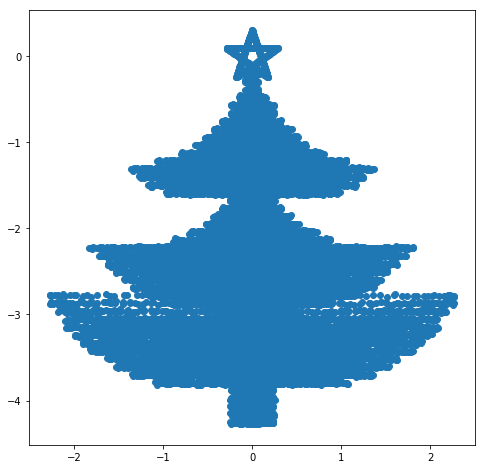

In [516]:
plt.figure(figsize = (8,8))
plt.scatter((X[:,0]+X[:,2]),X[:,1])
plt.show()

In [522]:
pipeline = mp.mapper.make_mapper_pipeline(filter_func= None,
                                          cover=mp.cover.CubicalCover(n_intervals = 20, overlap_frac = 0.25),
                                          verbose=True,
                                         )

graph = pipeline.fit_transform(X)

[Pipeline] ............ (step 1 of 3) Processing scaler, total=   0.0s
[Pipeline] ....... (step 2 of 3) Processing filter_func, total=   0.0s
[Pipeline] ............. (step 3 of 3) Processing cover, total=   1.1s
[Pipeline] .... (step 1 of 3) Processing pullback_cover, total=   1.1s
[Pipeline] ........ (step 2 of 3) Processing clustering, total=   2.8s
[Pipeline] ............. (step 3 of 3) Processing nerve, total= 1.4min


In [523]:
# plot
node_elements = nx.get_node_attributes(graph, 'elements')

pos = dict()
node_colors = []
i=0
for n in node_elements.keys(): 
    pos[n] = X[node_elements[n]].mean(axis = 0)
    node_colors.append("yellow" if pos[n][1]>=-0.3 else "brown" if pos[n][1]<-4 else "red" if i%5==0 else "green")
    i+=1
#pos = nx.spring_layout(graph, seed=0, dim=3)
#pos = nx.kamada_kawai_layout(graph)
#pos = nx.layout.spectral_layout(graph)


node_text = [k for k in node_elements.keys()]
node_sizes = [len(el) for el in node_elements.values()]

fig = mp.visualize.create_network_3d(graph, 
                                    pos, 
                                    [20]*len(node_sizes),#node_sizes, 
                                    node_colors, 
                                    node_text, 
                                    node_scale=20)

fig.update_layout(width=700,height=700,margin=go.layout.Margin(t=20,l=200,r=50))
fig.show()

# Snowflake

In [616]:
# generate data (inspired by https://projects.raspberrypi.org/en/projects/turtle-snowflakes/3)
X = []

u = 30
teta = 0
x = [0,0]
X.append(x)

for i in range(8):
    
    # branch:
    for i in range(3):
        for j in range(3):
            x = [x[0]+ u*np.cos(teta),x[1]+ u*np.sin(teta)]  #elsa.forward(30)
            X.append(x)
            x = [x[0]- u*np.cos(teta),x[1]- u*np.sin(teta)] #elsa.backward(30)
            X.append(x)
            teta+=np.pi/4 #elsa.right(45)
        teta-=np.pi/2 #elsa.left(90)
        x = [x[0]- u*np.cos(teta),x[1]- u*np.sin(teta)] #elsa.backward(30)
        X.append(x)
        teta-=np.pi/4 #elsa.left(45)
        
    teta+=np.pi/2 #elsa.right(90)
    x = [x[0]+ 3*u*np.cos(teta),x[1]+ 3*u*np.sin(teta)] #elsa.forward(90)
    X.append(x)
    
    teta-=np.pi/4#elsa.left(45)
    
X  = np.array(X)
tmp = []
for i in range(len(X)-1):
    tmp += [alpha*X[i,:] + (1-alpha)*X[i+1,:] for alpha in np.linspace(0,1,10)]
X = np.array(tmp)
del tmp

In [623]:
# generate data (inspired by https://projects.raspberrypi.org/en/projects/turtle-snowflakes/3)
X = []

u = 30
teta = 0
X.append([0,0])

for i in range(8):
    # branch:
    for i in range(3):
        for j in range(3):
            X.append([X[-1][0]+ u*np.cos(teta),X[-1][1]+ u*np.sin(teta)])       
            X.append([X[-1][0]- u*np.cos(teta),X[-1][1]- u*np.sin(teta)] )         
            teta+=np.pi/4 
            
        teta-=np.pi/2
        X.append([X[-1][0]- u*np.cos(teta),X[-1][1]- u*np.sin(teta)] )
        teta-=np.pi/4
        
    teta+=np.pi/2 
    X.append([X[-1][0]+ 3*u*np.cos(teta),X[-1][1]+ 3*u*np.sin(teta)] )
    teta-=np.pi/4
    
X  = np.array(X)
# fill the dots
tmp = []
for i in range(len(X)-1):
    tmp += [alpha*X[i,:] + (1-alpha)*X[i+1,:] for alpha in np.linspace(0,1,10)]
X = np.array(tmp)
del tmp

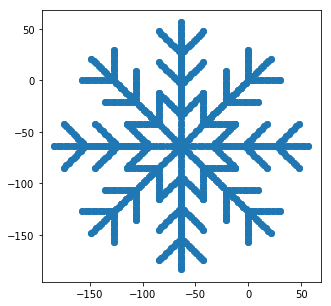

In [624]:
plt.figure(figsize = (5,5))
plt.scatter(X[:,0],X[:,1])
plt.show()

In [666]:
pipeline = mp.mapper.make_mapper_pipeline(filter_func= None,
                                          cover=mp.cover.CubicalCover(n_intervals = 15, overlap_frac = 0.15),
                                          verbose=True,
                                         )

graph = pipeline.fit_transform(X)

[Pipeline] ............ (step 1 of 3) Processing scaler, total=   0.0s
[Pipeline] ....... (step 2 of 3) Processing filter_func, total=   0.0s
[Pipeline] ............. (step 3 of 3) Processing cover, total=   0.0s
[Pipeline] .... (step 1 of 3) Processing pullback_cover, total=   0.0s
[Pipeline] ........ (step 2 of 3) Processing clustering, total=   0.1s
[Pipeline] ............. (step 3 of 3) Processing nerve, total=   0.3s


In [667]:
# plot
node_elements = nx.get_node_attributes(graph, 'elements')

pos = dict()
for n in node_elements.keys(): pos[n] = X[node_elements[n]].mean(axis = 0)
#pos = nx.spring_layout(graph, seed=0, dim=2)
#pos = nx.kamada_kawai_layout(graph)
#pos = nx.layout.spectral_layout(graph)


node_text = [k for k in node_elements.keys()]
node_sizes = [len(el) for el in node_elements.values()]
node_colors = "lightblue"#X[:,1]

fig = mp.visualize.create_network_2d(graph, 
                        pos, 
                        node_sizes, 
                        node_colors, 
                        node_text, 
                        node_scale=20)

fig.update_layout(width=800,height=700,margin=go.layout.Margin(l=200,r=50))
fig.show()